In [2]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import pickle
import os

from src.utils.data_prep_util import (extract_frames, get_train_test_tensors_and_labels_lst)
from src.utils.exp_util import (get_layer_and_event_type_df, get_saved_index_pkl, basic_plot, 
                                get_epochs_from_session_id_st_en, get_epochs_from_iso_timestamps_lst,
                                get_event_types_for_layer_lst, get_layer_train_test_indices_cls_map_dict,
                               get_can_bus_corresponding_to_session_id_st_en_dict,
                               get_can_bus_df_from_clipped_dikt_df)
from src.utils.consts import (
        HDD_SAVED_INDEX_PKL_PATH, HDD_VIDEO_PATH, HDD_DATA_BASE_DIR, 
        HDD_CBUS_CSV_FILES, HDD_EVENT_TYPES, HDD_FVECS_PATH)


In [24]:
train_dict, test_dict, cls_dict = get_layer_train_test_indices_cls_map_dict(0)
ffvecs_data = np.load(HDD_FVECS_PATH + "hdd_frame_vecs_dict_fps_3_1_model_ResNet.npy", 
                      allow_pickle=True)

In [25]:
train_data, train_labels, test_data, test_labels = get_train_test_tensors_and_labels_lst(
    train_dict, test_dict, ffvecs_data, cls_dict)

In [26]:
#train_data, train_labels, test_data, test_labels
import torchvision.transforms as transforms
to_tensor = transforms.ToTensor()
#print(to_tensor(np.array(train_data)).shape)
print(len(np.unique(train_labels)))
print(len(test_data))
#print(test_labels)
np.unique(train_labels)

11
3736


array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

In [27]:
print(train_dict.keys())
print(test_dict.keys())
print(cls_dict)

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10])
{0: [1, 6], 1: [7], 2: [0], 3: [8], 4: [3], 5: [5], 6: [11], 7: [2], 8: [4], 9: [10], 10: [12]}


In [14]:
df = get_layer_and_event_type_df(layer=0)
sample_df = df.head()
sample_df

右轉 right turn


,layer,event_type,session_id,start,end
0,0,0,201710031645,242505,249955
1,0,0,201710031645,296036,307880
2,0,0,201710031645,1212546,1221093
3,0,0,201710031645,1415401,1419495
4,0,0,201710031645,1428624,1433390


In [30]:
dikt = get_saved_index_pkl()
print(dikt["layer_ix"])

{0: '主動的駕駛行為 Operation_Goal-oriented', 1: '原因 Cause', 2: '區域 Area', 3: '注意-1 Attention', 4: '備註 note', 5: '注意-2 Attention 2', 6: '被動的駕駛行為 Operation_Stimuli-driven'}


In [16]:
can_bus_dict = get_can_bus_corresponding_to_session_id_st_en_dict(
        "201710031645", 242505, 249955, HDD_CBUS_CSV_FILES)

201710031645 242505 249955
2017-10-03-16-45-21_new_0.75.mp4
/home/rgaurav/Documents/UData/auto-intention-snns/HDD_Data//release_2019_07_08/201710031645/camera/center//2017-10-03-16-45-21_new_0.75.mp4


/home/rgaurav/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]


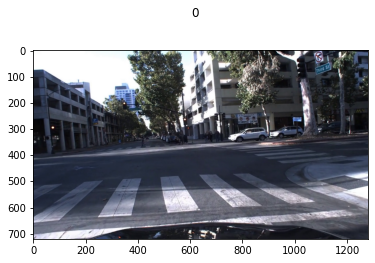

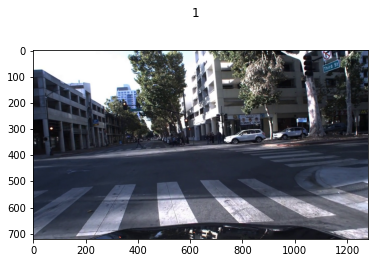

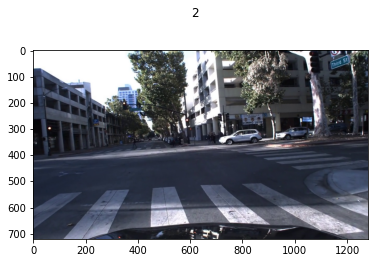

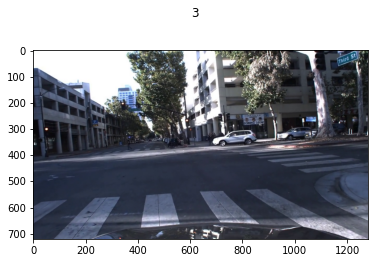

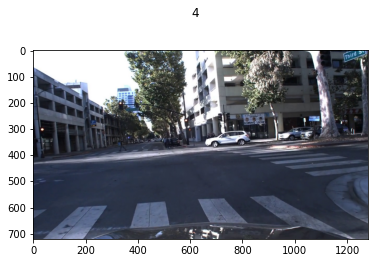

...

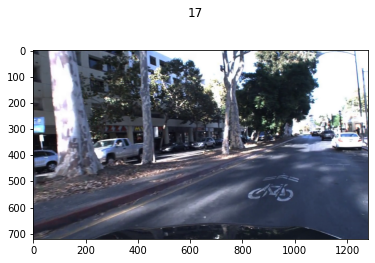

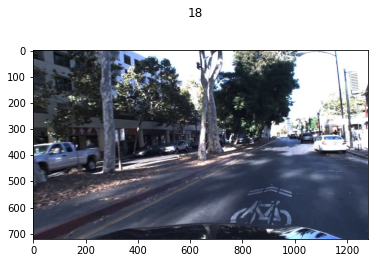

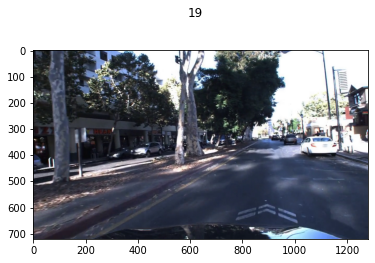

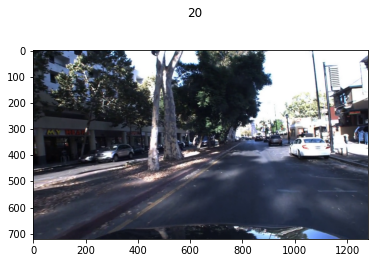

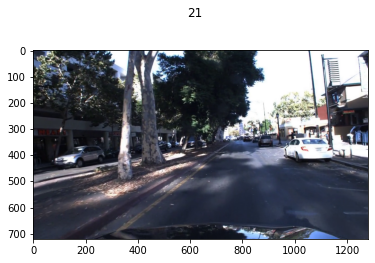

In [17]:
for i in range(1): # sample_df.shape[0]):
    session_id, start, end = sample_df.iloc[i].session_id, sample_df.iloc[i].start, sample_df.iloc[i].end
    print(session_id, start, end)
    files = os.listdir(HDD_VIDEO_PATH.format(session_id))
    if len(files) != 1:
        print("Missing some videos.")
    print(files[0])
    path = HDD_VIDEO_PATH.format(session_id)+"/"+files[0]
    print(path)
    frames = extract_frames(path, start/1000, end/1000, "3/1")

for i in range(frames.shape[0]):
    fig, ax = plt.subplots()
    ax.imshow(frames[i])
    fig.suptitle(i)

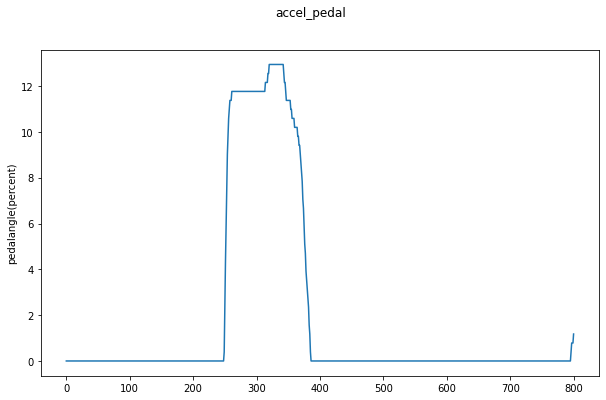

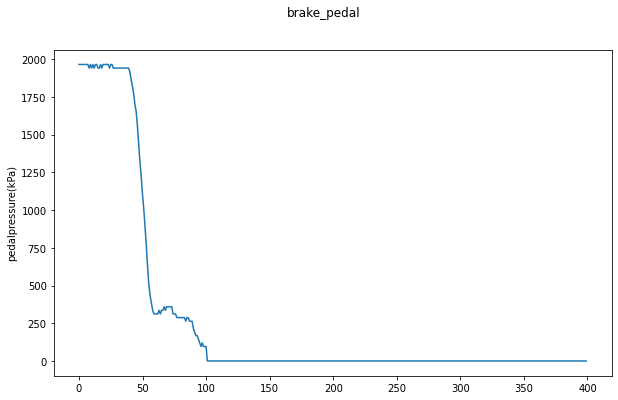

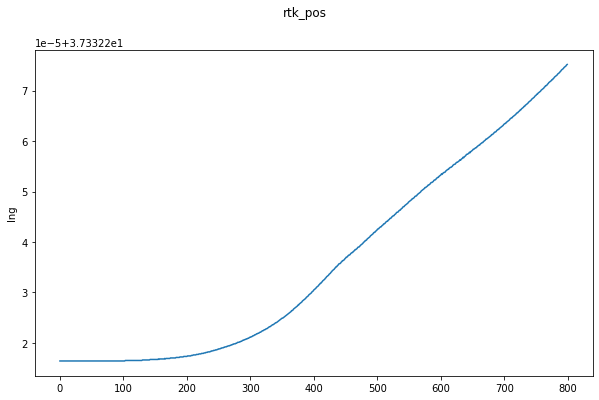

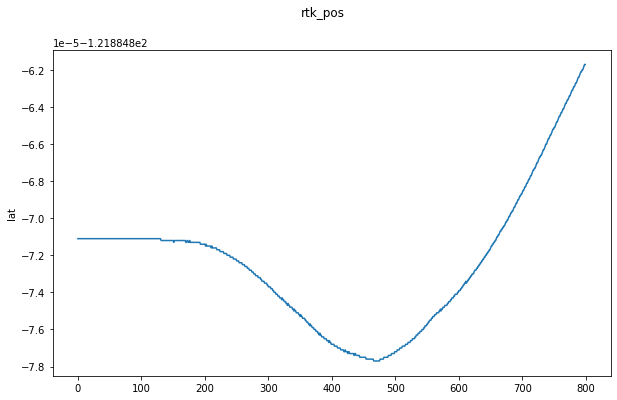

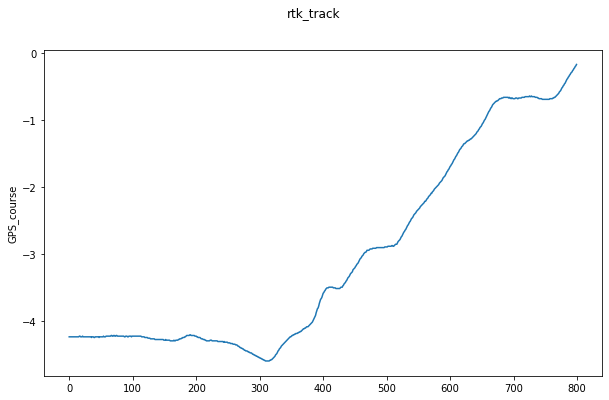

...

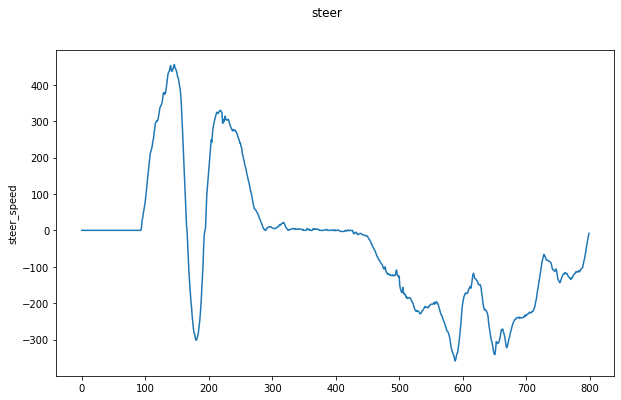

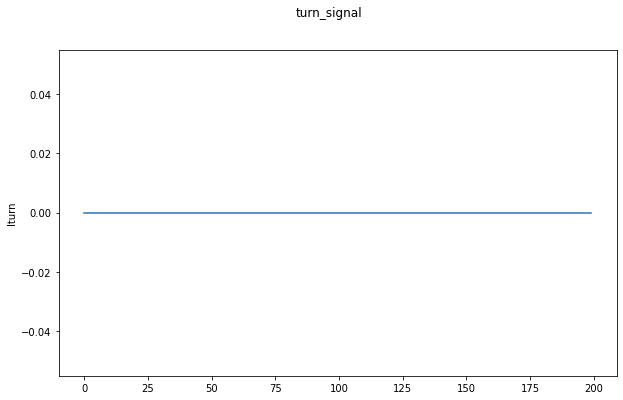

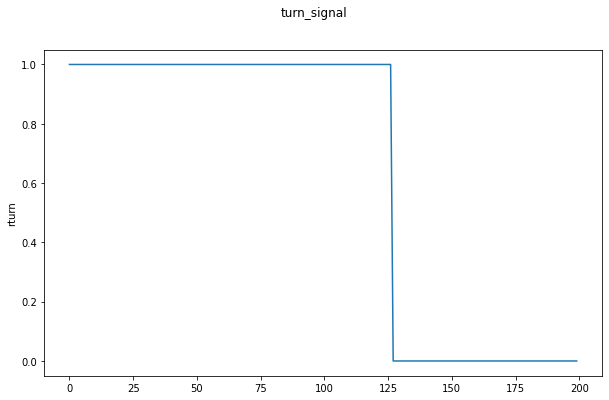

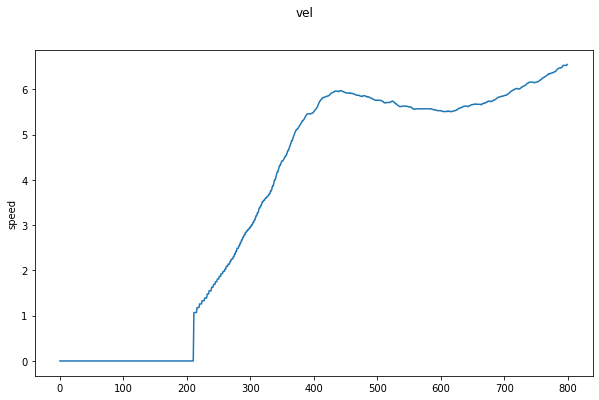

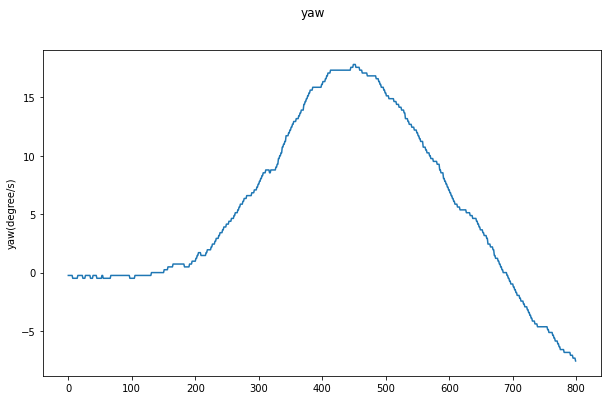

In [20]:
for key in can_bus_dict.keys():
    file_dikt = can_bus_dict[key]
    for p_key in file_dikt.keys():
        basic_plot(file_dikt[p_key], p_key, key)

In [3]:
print(dikt.keys())
print(dikt["turn_signal"]["rturn"])

dict_keys(['accel_pedal', 'brake_pedal', 'rtk_pos', 'rtk_track', 'steer', 'turn_signal', 'vel', 'yaw'])
5927    1.0
5928    1.0
5929    1.0
5930    1.0
5931    1.0
       ... 
6122    0.0
6123    0.0
6124    0.0
6125    0.0
6126    0.0
Name: rturn, Length: 200, dtype: float64


In [3]:
df = pd.read_csv("/home/rgaurav/Documents/UData/auto-intention-snns/HDD_Data/release_2019_07_08/201710031645/general/csv/turn_signal.csv")

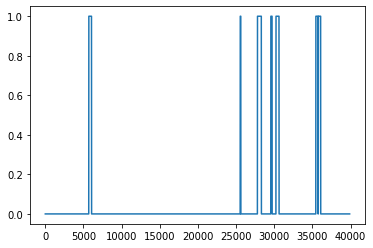

In [4]:
plt.plot(df["rturn"])

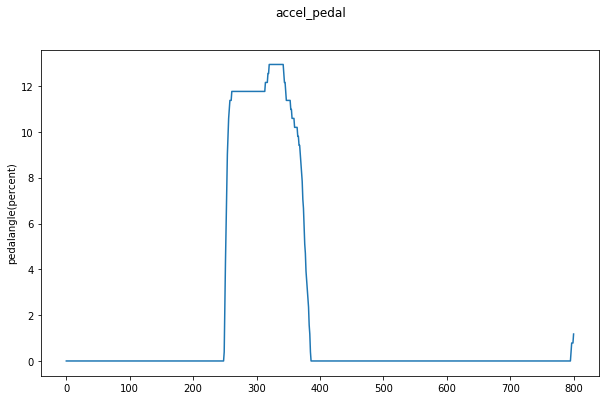

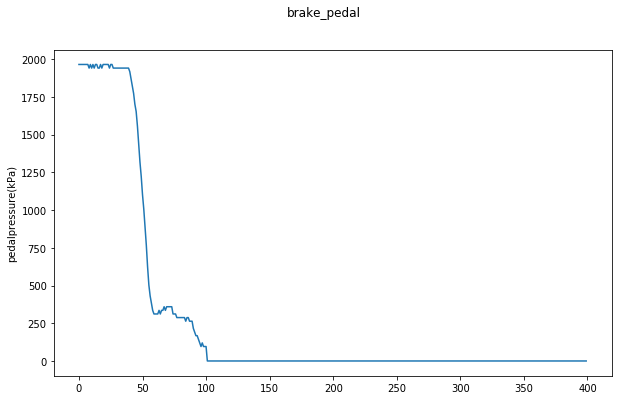

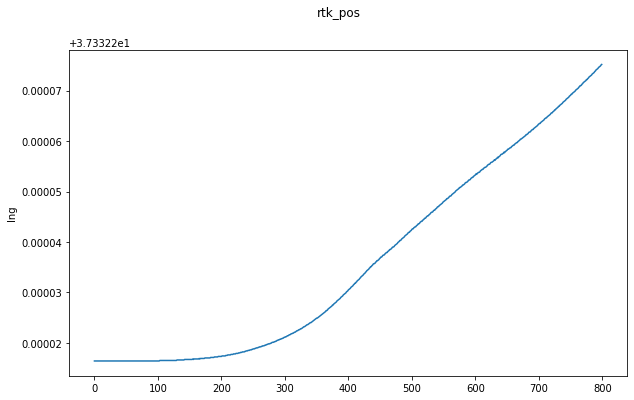

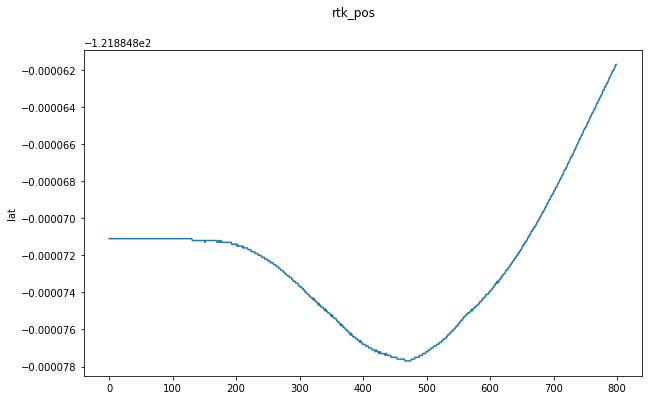

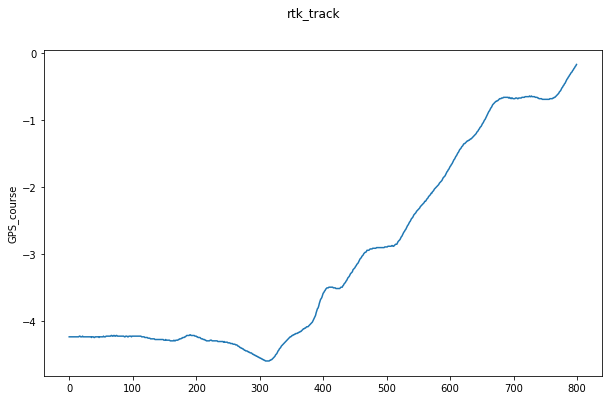

...

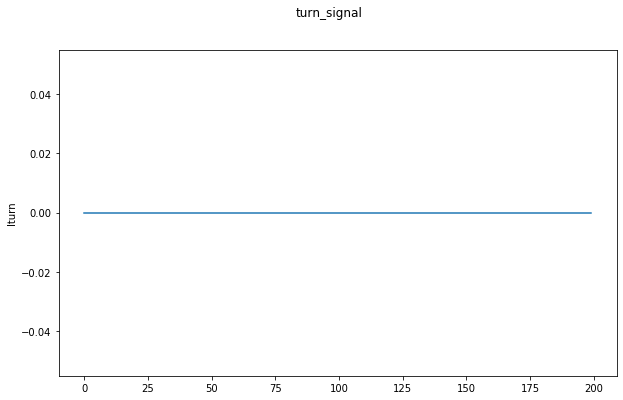

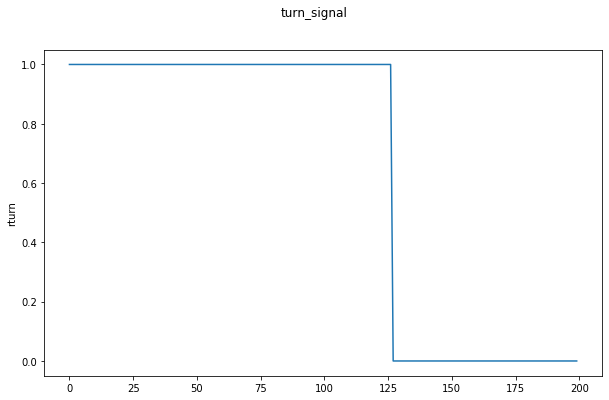

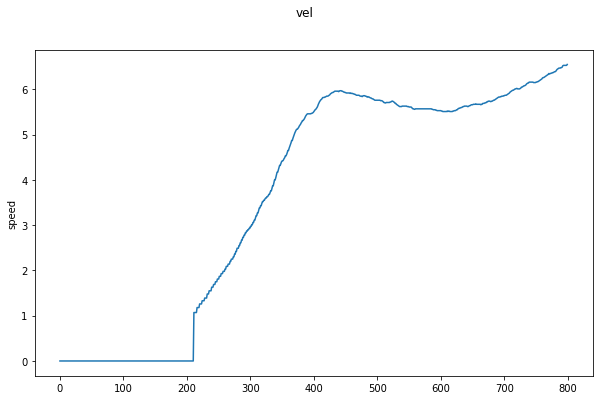

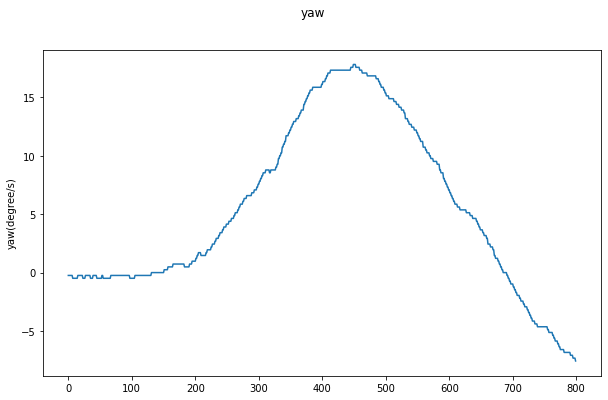

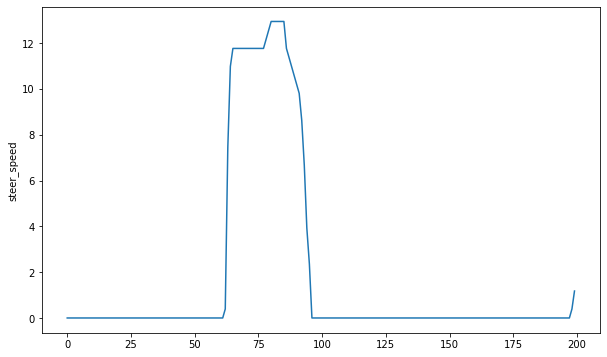

In [8]:
basic_plot(dikt_df["pedalangle(percent)"], "steer_speed")

In [10]:
csv_path = HDD_DATA_BASE_DIR + "/release_2019_07_08/201710031645/general/csv/accel_pedal.csv"
df_acc = pd.read_csv(csv_path)

csv_path = HDD_DATA_BASE_DIR + "/release_2019_07_08/201710031645/general/csv/turn_signal.csv"
df_ts = pd.read_csv(csv_path)

print(df_acc.head())
print("*"*50)
print(df_ts.head())
print(df_acc.shape, df_ts.shape)
print(df_acc.iloc[160168])
print(df_ts.iloc[39875])
print(type(df_ts["iso_timestamp"][0]))

   # unix_timestamp                        iso_timestamp  pedalangle(percent)
0      1.507074e+09  2017-10-03T16:45:24.958810329-07:00                  0.0
1      1.507074e+09  2017-10-03T16:45:24.968758821-07:00                  0.0
2      1.507074e+09  2017-10-03T16:45:24.978741884-07:00                  0.0
3      1.507074e+09  2017-10-03T16:45:24.988681555-07:00                  0.0
4      1.507074e+09  2017-10-03T16:45:24.998613358-07:00                  0.0
**************************************************
   # unix_timestamp                        iso_timestamp  lturn  rturn
0      1.507074e+09  2017-10-03T16:45:24.965189219-07:00    0.0    0.0
1      1.507074e+09  2017-10-03T16:45:25.005153179-07:00    0.0    0.0
2      1.507074e+09  2017-10-03T16:45:25.045107365-07:00    0.0    0.0
3      1.507074e+09  2017-10-03T16:45:25.085169315-07:00    0.0    0.0
4      1.507074e+09  2017-10-03T16:45:25.125170946-07:00    0.0    0.0
(160169, 3) (39876, 4)
# unix_timestamp                

In [6]:
arr = get_epochs_from_iso_timestamps_lst(df_ts["iso_timestamp"].tolist())
print(arr.tolist()[0])

1507063524.0


In [1]:
arr = get_epochs_from_iso_timestamps_lst(df_ts["iso_timestamp"].tolist())

NameError: name 'get_epochs_from_iso_timestamps_lst' is not defined

       layer  event_type    session_id    start      end
12631      1          16  201710031645   261030   290537
12632      1          16  201710031645   322749   350785
12633      1          16  201710031645   407327   411842
12634      1          16  201710031645  1357700  1380738
12635      1          16  201706071518   549590   569300
{0: '主動的駕駛行為 Operation_Goal-oriented', 1: '原因 Cause', 2: '區域 Area', 3: '注意-1 Attention', 4: '備註 note', 5: '注意-2 Attention 2', 6: '被動的駕駛行為 Operation_Stimuli-driven'}


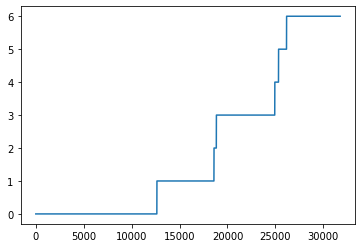

In [6]:
df = get_layer_and_event_type_df(layer=1)
sample_df = df.head()
print(sample_df)
dikt = get_saved_index_pkl()
print(dikt["layer_ix"])
plt.plot(dikt["events_pd"]["layer"])

In [3]:
fvecs = np.load(HDD_FVECS_PATH + "hdd_frame_vecs_dict_fps_3_1_model_ResNet.npy", 
                allow_pickle=True)
fvecs_idx = np.load(HDD_FVECS_PATH + "hdd_frame_vecs_idx_lst_fps_3_1_model_ResNet.npy")

In [4]:
print(fvecs_idx[200])
print(fvecs.item().get(802))

204
(tensor([[[0.4455, 0.4522, 0.1415,  ..., 0.7740, 0.5218, 0.2340],
         [0.3793, 0.4913, 0.1026,  ..., 0.6730, 0.4596, 0.2531],
         [0.4245, 0.4457, 0.1275,  ..., 0.6571, 0.4164, 0.3331],
         ...,
         [0.6157, 1.1875, 0.2852,  ..., 1.2391, 0.2765, 0.3838],
         [0.5983, 1.0532, 0.3077,  ..., 1.1735, 0.3105, 0.3010],
         [0.4920, 1.0248, 0.2769,  ..., 0.9205, 0.3800, 0.2455]]]), (0, 0))


In [11]:
event_types_lst = get_event_types_for_layer_lst(layer=0)
event_types_lst

[[1, 6], [7], [0], [8], [3], [5], [11], [2], [4], [10], [12]]

In [12]:
print(dikt["event_type_ix"])
print(dikt.keys())
df = dikt["events_pd"]
df0 = get_layer_and_event_type_df(layer=0)
df1 = get_layer_and_event_type_df(layer=1)
df2 = get_layer_and_event_type_df(layer=2)
df3 = get_layer_and_event_type_df(layer=3)
df4 = get_layer_and_event_type_df(layer=4)
df5 = get_layer_and_event_type_df(layer=5)
df6 = get_layer_and_event_type_df(layer=6)
print(df0["event_type"].unique())
print(df1["event_type"].unique())
print(df2["event_type"].unique())
print(df3["event_type"].unique())
print(df4["event_type"].unique())
print(df5["event_type"].unique())
print(df6["event_type"].unique())

{0: '右轉 right turn', 1: '穿過十字路口 intersection passing', 2: '併道 merge', 3: '切左道 left lane change', 4: '右邊分支 right lane branch', 5: '切右道 right lane change', 6: '穿過T字路口 intersection passing', 7: '左轉 left turn', 8: '穿過人行道 crosswalk passing', 9: '駕駛者路旁停車 park', 10: '穿過鐵路 railroad passing', 11: '左邊分支 left lane branch', 12: 'U轉 U-turn', 13: 'park park', 14: '', 15: 'Park park', 16: '前方車流 congestion', 17: '路標 Sign', 18: '紅燈 red light', 19: '車輛橫穿 crossing vehicle', 20: '路旁停的車 Parked vehicle', 21: '黃燈 yellow light', 22: '行人穿越 crossing pedestrian', 23: '車輛併道 merging vehicle', 24: '自行車騎士 on-road bicyclist', 25: '行人靠近路中央 pedestrian near ego lane', 26: '駕駛者路旁停車 park', 27: '摩托車騎士 on-road motorcyclist', 28: '前車切入vehicle cut-in', 29: '道路施工 road work', 30: '待轉車輛 turning vehicle', 31: '車輛偏移主道 vehicle passing with lane departure', 32: '城市 downtown', 33: '高速 freeway', 34: '隧道 tunnel', 35: '紅燈 red light', 36: '摩托車騎士 on-road motorcyclist', 37: '前車切入vehicle cut-in', 38: '車輛橫穿 crossing vehicle', 39: '路標 Sign', 

In [6]:
frames = extract_frames("/home/rgaurav/Documents/UData/auto-intention-snns/HDD_Data//release_2019_07_08/201710031645/camera/center//2017-10-03-16-45-21_new_0.75.mp4", 242505, 249955, "1/10")
print(frames.shape)
plt.imshow(frames[0])

No frames found, perhaps the video_path is wrong. Check it.
(0,)


IndexError: index 0 is out of bounds for axis 0 with size 0

##################################################################################################################

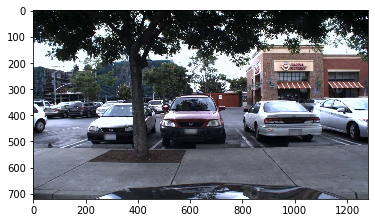

In [4]:
plt.imshow(frames[1])

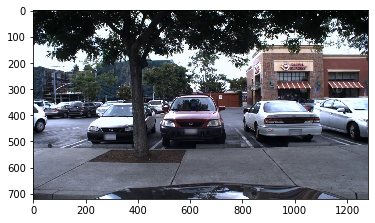

In [4]:
plt.imshow(frames[2])

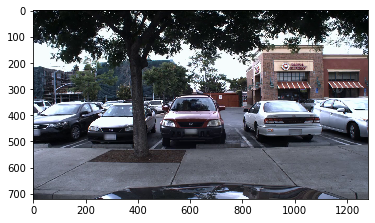

In [5]:
plt.imshow(frames[3])

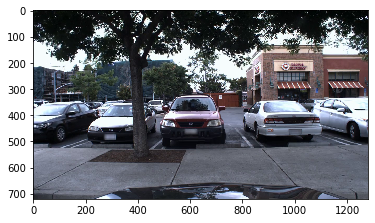

In [6]:
plt.imshow(frames[4])

In [4]:
import torch
k = torch.zeros(2, 1, 120)

In [5]:
k.shape

torch.Size([2, 1, 120])

In [13]:
k[:, -1, :].shape

torch.Size([2, 120])

In [10]:
k.view(-1).shape

torch.Size([240])

In [11]:
torch.randn(128, 20).shape

torch.Size([128, 20])

In [18]:
k.size()

torch.Size([2, 1, 120])

In [20]:
k.view(-1, 2, 120).shape

torch.Size([1, 2, 120])

/home/rgaurav/anaconda3/envs/pytorch/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  import sys


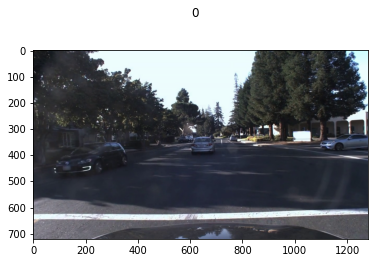

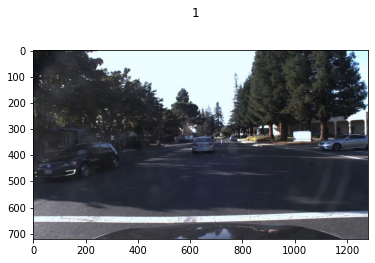

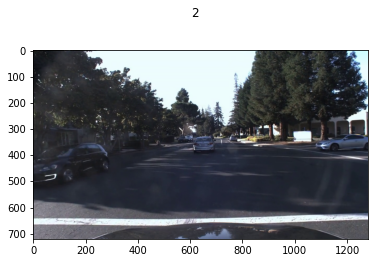

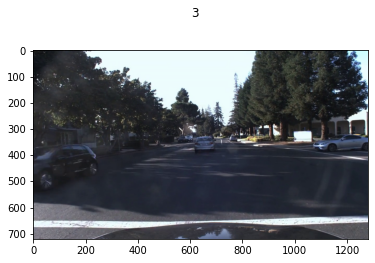

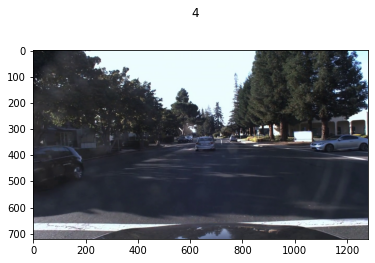

...

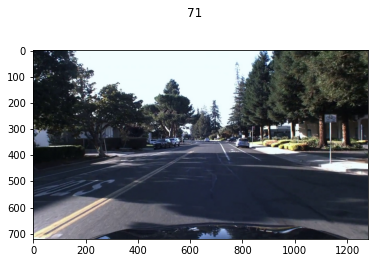

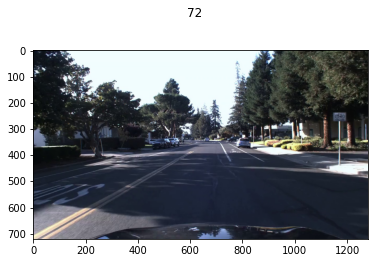

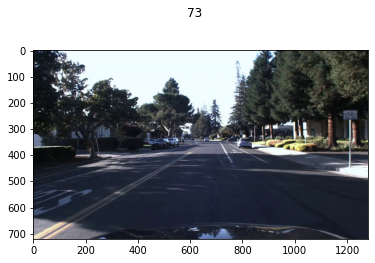

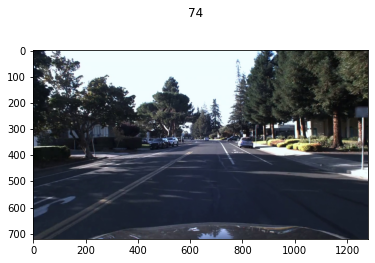

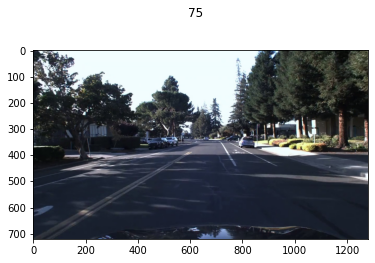

In [6]:
# Intersection Passing : Event_Type-> 1 and 6.
session_id, start, end = "201710031645", 1235389, 1242967
files = os.listdir(HDD_VIDEO_PATH.format(session_id))
path = HDD_VIDEO_PATH.format(session_id)+"/"+files[0]
frames = extract_frames(path, start/1000, end/1000, "3/1")

for i in range(frames.shape[0]):
    fig, ax = plt.subplots()
    ax.imshow(frames[i])
    fig.suptitle(i)